In [63]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/celeb-fake/id0_id3_0009.mp4
/kaggle/input/celeb-fake/id0_id2_0008.mp4
/kaggle/input/celeb-fake/id0_id4_0003.mp4
/kaggle/input/celeb-fake/id0_id4_0004.mp4
/kaggle/input/celeb-fake/id0_id2_0009.mp4
/kaggle/input/celeb-fake/id0_id9_0007.mp4
/kaggle/input/celeb-fake/id0_id3_0005.mp4
/kaggle/input/celeb-fake/id0_id9_0000.mp4
/kaggle/input/celeb-fake/id0_id2_0004.mp4
/kaggle/input/celeb-fake/id0_id2_0007.mp4
/kaggle/input/celeb-fake/id0_id3_0001.mp4
/kaggle/input/celeb-fake/id0_id4_0000.mp4
/kaggle/input/celeb-fake/id0_id2_0000.mp4
/kaggle/input/celeb-fake/id0_id4_0002.mp4
/kaggle/input/celeb-fake/id0_id9_0006.mp4
/kaggle/input/celeb-fake/id0_id1_0002.mp4
/kaggle/input/celeb-fake/id0_id3_0007.mp4
/kaggle/input/celeb-fake/id0_id9_0002.mp4
/kaggle/input/celeb-fake/id0_id3_0003.mp4
/kaggle/input/celeb-fake/id0_id6_0007.mp4
/kaggle/input/celeb-fake/id0_id6_0009.mp4
/kaggle/input/celeb-fake/id0_id1_0000.mp4
/kaggle/input/celeb-fake/id0_id2_0006.mp4
/kaggle/input/celeb-fake/id0_id2_0

### Setup

In [64]:
!git clone https://github.com/rkuo2000/facenet-pytorch facenet_pytorch

fatal: destination path 'facenet_pytorch' already exists and is not an empty directory.


In [65]:
import cv2
import torch
import numpy as np
import timm
import shutil
import pandas as pd
import matplotlib.pyplot as plt
from facenet_pytorch import MTCNN
from torchvision import transforms
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import datetime
import tensorflow as tf
from tensorflow import keras
from IPython.display import Image as ImageDisplay
import matplotlib.cm as cm


### Model

In [66]:
model_builder = keras.applications.xception.Xception
img_size = (224, 224)
preprocess_input = keras.applications.xception.preprocess_input
decode_predictions = keras.applications.xception.decode_predictions


# Create the model, by using pretrained weights on ImageNet
model = model_builder(weights="imagenet")

# Inicializar modelo e definir dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(model.summary())

Model: "xception"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 299, 299, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 149, 149, 32)   │            864 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 149, 149, 32)   │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 149, 149, 32)   │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 147, 147, 64)   │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 147, 147, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 147, 147, 64)   │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 147, 147, 128)  │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 147, 147, 128)  │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 147, 147, 128)  │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 147, 147, 128)  │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 147, 147, 128)  │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_16 (Conv2D)        │ (None, 74, 74, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 74, 74, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├──────────────────────

 Total params: 22,910,480 (87.40 MB)

 Trainable params: 22,855,952 (87.19 MB)

 Non-trainable params: 54,528 (213.00 KB)

None


### Prepare for Detection

In [67]:
# Transformações para normalização
transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

In [68]:
# Função para extrair frames do vídeo
def extract_frames(video_path, interval=5):
    cap = cv2.VideoCapture(video_path)
    frames = []
    frame_count = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        if frame_count % interval == 0:
            frames.append(frame)
        frame_count += 1

    cap.release()
    return frames

In [69]:
# Criar ou limpar o diretório para armazenar as faces extraídas
output_dir = "faces-extraidas"
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)  # Remove todos os arquivos da pasta
os.makedirs(output_dir, exist_ok=True)  # Recria a pasta limpa

# Função para detectar rostos nos frames usando MTCNN
def detect_faces(frames):
    mtcnn = MTCNN(keep_all=True, device=device)
    faces = []
    for i, frame in enumerate(frames):
#    for frame in frames:
        image = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        boxes, _ = mtcnn.detect(image)

#        if boxes is not None:
#            for box in boxes:
#                x1, y1, x2, y2 = map(int, box)
#                face = image.crop((x1, y1, x2, y2))
#                faces.append((frame, face))

        if boxes is not None:
            for j, box in enumerate(boxes):
                x1, y1, x2, y2 = map(int, box)
                face = image.crop((x1, y1, x2, y2))
                
                # Sa+
                # var a face extraída como imagem
                face_filename = os.path.join(output_dir, f"frame_{i}_face_{j}.jpg")
                face.save(face_filename)

                # Adicionar à lista de resultados
                faces.append((frame, face))

    return faces

In [70]:
def classify_faces(faces):
    real_count = 0
    fake_count = 0
    results = []

    for frame, face in faces:
        # Converter a imagem para o formato necessário pelo modelo Xception
        face = face.resize((299, 299))  # Redimensionar para 299x299
        face = np.array(face)  # Converter para numpy array
        face = np.expand_dims(face, axis=0)  # Adicionar dimensão do batch
        face = preprocess_input(face)  # Aplicar pré-processamento do Xception
        
        with torch.no_grad():
            output = model.predict(face)  # Usar .predict() no modelo do TensorFlow
            prob = tf.nn.softmax(output)[0]  # Aplicar softmax no TensorFlow
            label = "Deepfake" if prob[1] > prob[0] else "Real"
            confidence = prob[1].numpy() if label == "Deepfake" else prob[0].numpy()
            results.append((frame, label, confidence))
            
            if label == "Deepfake":
                fake_count += 1
            else:
                real_count += 1
    
    detection = "Deepfake" if fake_count > real_count else "Real"
    return results, detection


In [71]:
# Função para exibir resultados
def display_results(results):
    df = pd.DataFrame(results, columns=["Frame", "Classificação", "Confiança"])
    df.drop(columns=["Frame"], inplace=True)
    print(df)

    plt.figure(figsize=(8, 5))
    real_count = sum(1 for _, label, _ in results if label == "Real")
    deepfake_count = sum(1 for _, label, _ in results if label == "Deepfake")
    
    plt.bar(["Real", "Deepfake"], [real_count, deepfake_count], color=["blue", "red"])
    plt.title("Distribuição de Detecção de Deepfakes")
    plt.ylabel("Número de Frames")
    plt.show()

### Grad CAM

In [72]:
# Grad-CAM 
def grad_cam(model, image, target_layer_name, class_idx=1):
    img_array = np.array(image)  # Converter para array numpy
    img_array = cv2.resize(img_array, (299, 299))  # Corrigir tamanho para Xception
    img_array = np.expand_dims(img_array, axis=0)  # Adicionar dimensão do batch
    img_array = preprocess_input(img_array)  # Aplicar normalização

    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(target_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, class_idx]
    
    grads = tape.gradient(loss, conv_outputs)
    weights = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    weighted_conv_outputs = tf.reduce_sum(conv_outputs * weights, axis=-1)
    heatmap = np.maximum(weighted_conv_outputs, 0)
    heatmap /= np.max(heatmap) if np.max(heatmap) != 0 else 1

    return heatmap 



# Overlay heatmap on image
def overlay_heatmap(heatmap, image, alpha=0.4):
    img = np.array(image).astype('uint8')  # Converter para numpy
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))  # Redimensionar
    heatmap_colored = cm.jet(heatmap)  # Aplicar colormap
    heatmap_colored = np.uint8(255 * heatmap_colored[..., :3])  # Converter para uint8

    overlayed = cv2.addWeighted(img, 1 - alpha, heatmap_colored, alpha, 0)  # Criar overlay
    plt.imshow(overlayed)
    plt.axis('off')
    plt.show()

### Detect Video

In [73]:
# Pipeline completo
def detect_deepfakes(video_path, target_layer_name="block14_sepconv2_act"):
    print("Extraindo quadros...")
    frames = extract_frames(video_path)

    print("Detectando rostos...")
    faces = detect_faces(frames)
    
    for frame, face in faces:  
        print("Applying Grad-CAM...")
        heatmap = grad_cam(model, face, target_layer_name)  # Agora está no formato correto
        overlay_heatmap(heatmap, face) 

    print("Classificando rostos...")
    results, detection = classify_faces(faces)

    print("Exibindo resultados...")
    display_results(results)

Extraindo quadros...
Detectando rostos...
Applying Grad-CAM...


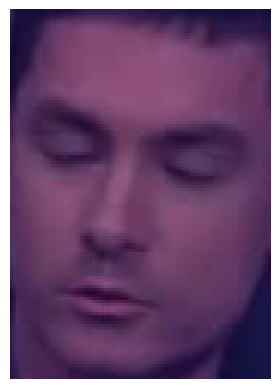

Applying Grad-CAM...


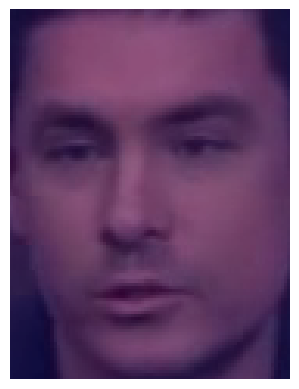

Applying Grad-CAM...


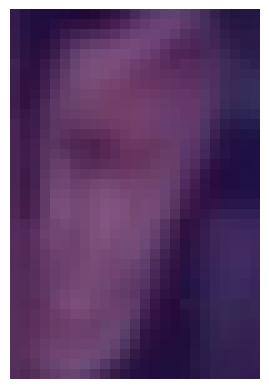

Applying Grad-CAM...


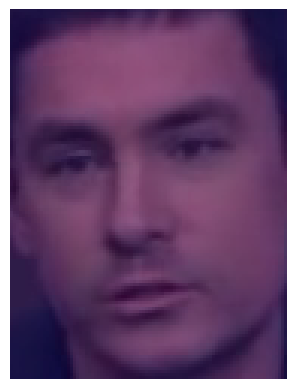

Applying Grad-CAM...


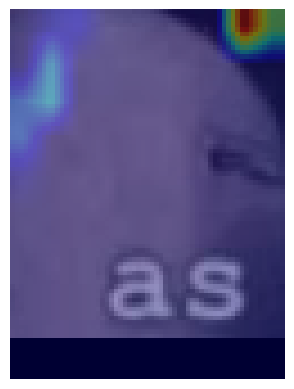

Applying Grad-CAM...


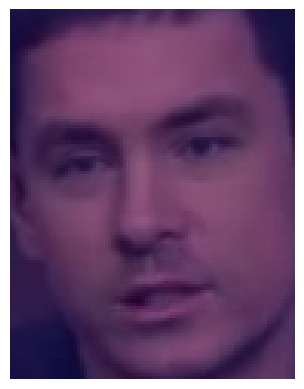

Applying Grad-CAM...


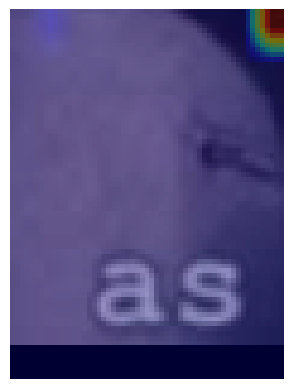

Applying Grad-CAM...


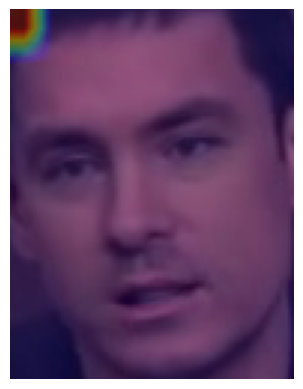

Applying Grad-CAM...


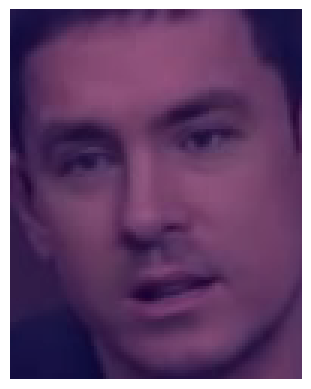

Applying Grad-CAM...


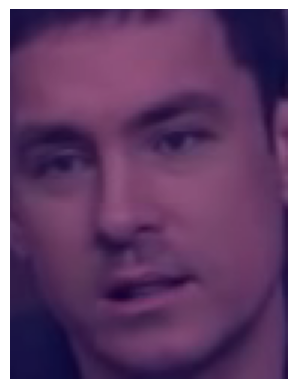

Applying Grad-CAM...


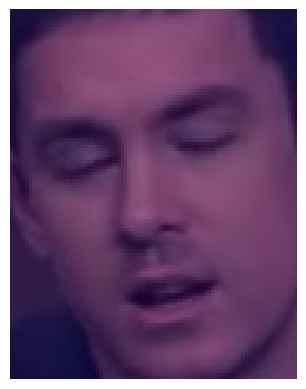

Applying Grad-CAM...


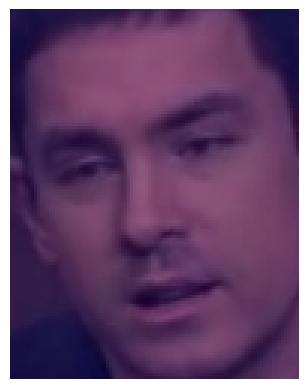

Applying Grad-CAM...


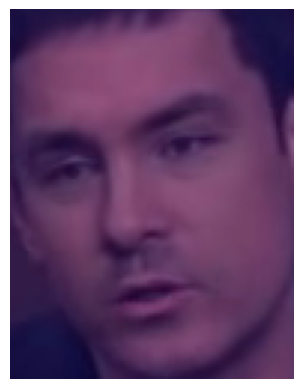

Applying Grad-CAM...


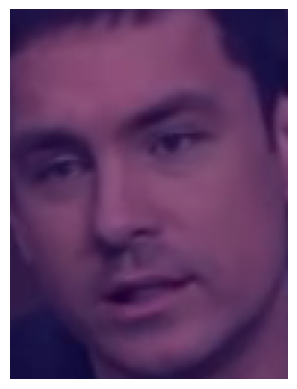

Applying Grad-CAM...


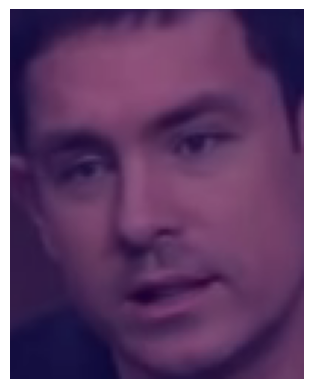

Applying Grad-CAM...


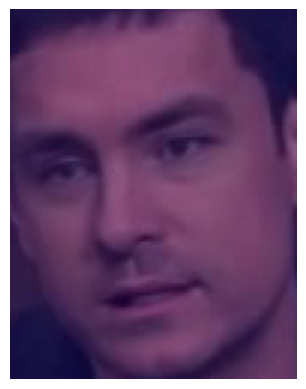

Applying Grad-CAM...


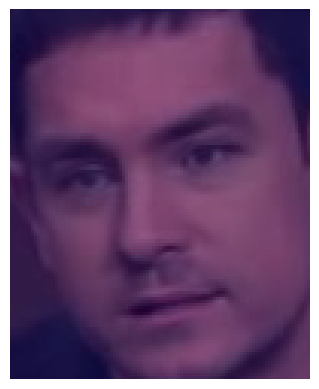

Applying Grad-CAM...


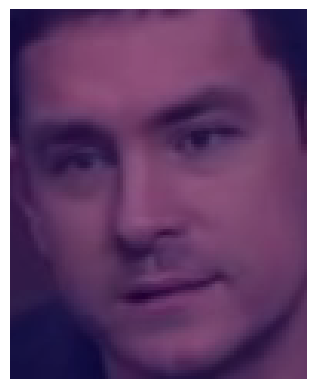

Applying Grad-CAM...


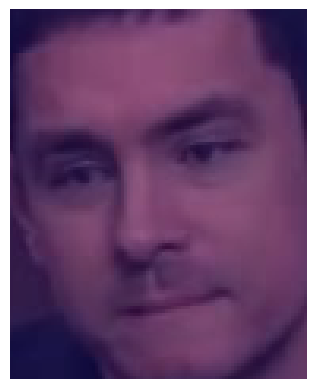

Applying Grad-CAM...


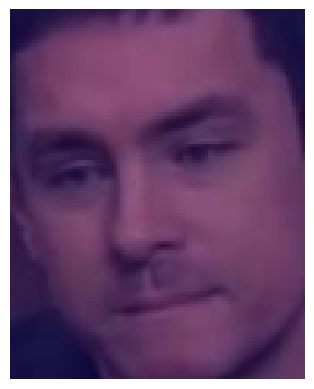

Applying Grad-CAM...


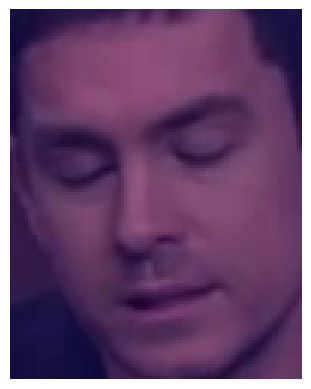

Applying Grad-CAM...


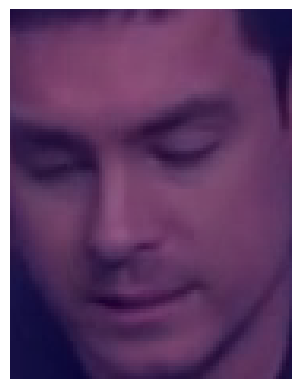

Applying Grad-CAM...


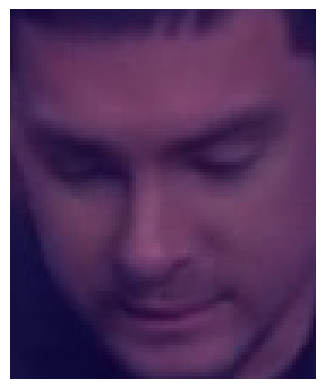

Applying Grad-CAM...


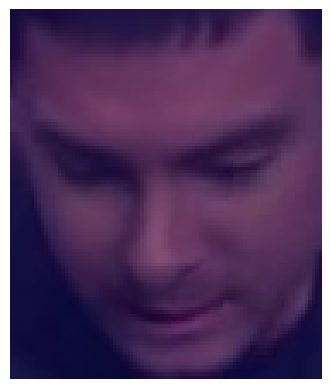

Applying Grad-CAM...


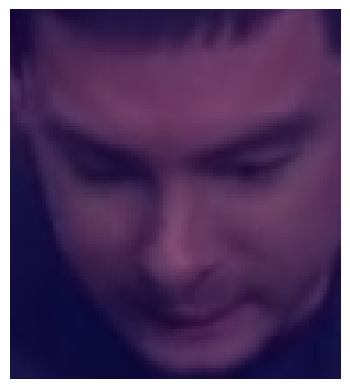

Applying Grad-CAM...


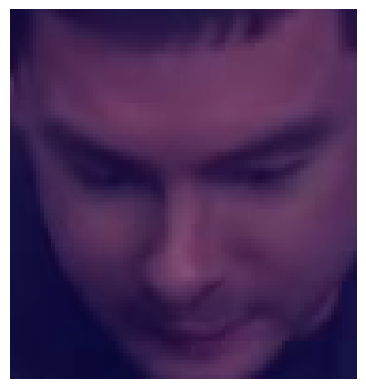

Applying Grad-CAM...


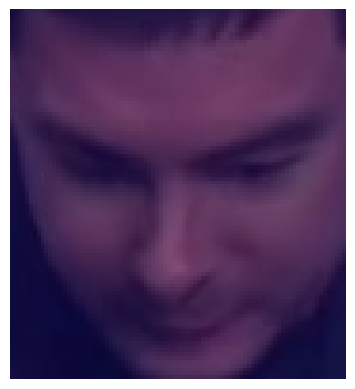

Applying Grad-CAM...


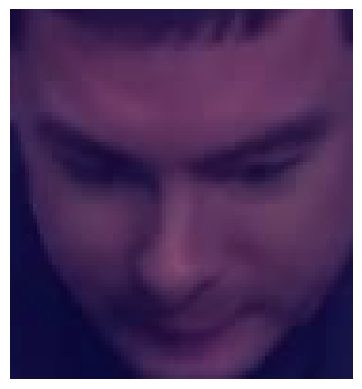

Applying Grad-CAM...


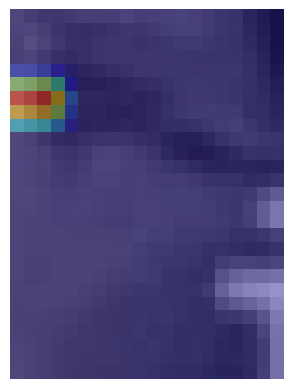

Applying Grad-CAM...


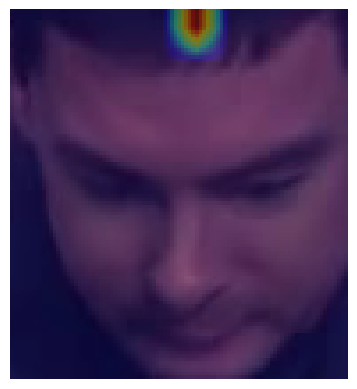

Applying Grad-CAM...


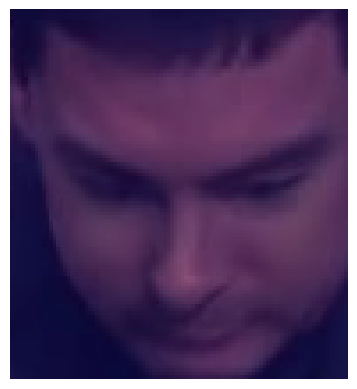

Applying Grad-CAM...


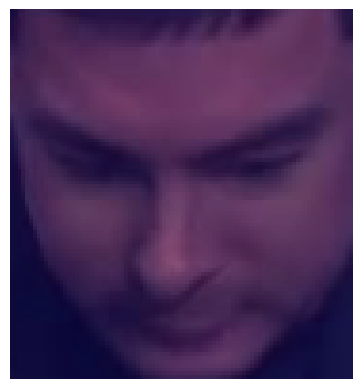

Applying Grad-CAM...


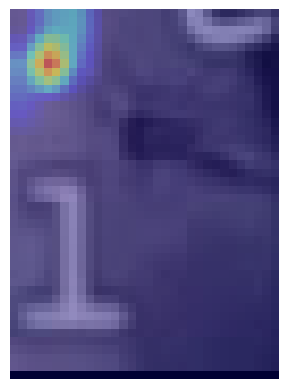

Applying Grad-CAM...


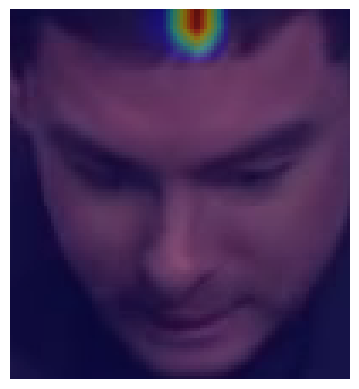

Applying Grad-CAM...


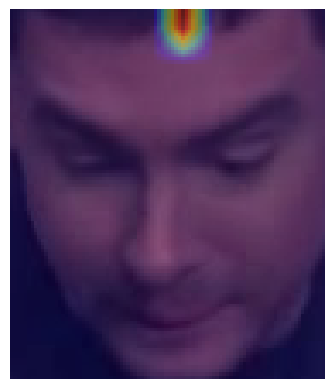

Applying Grad-CAM...


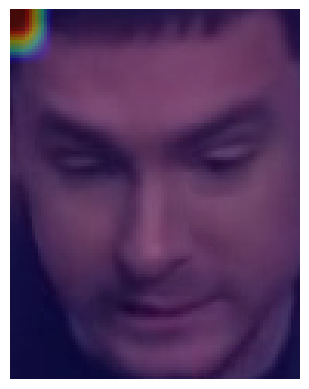

Applying Grad-CAM...


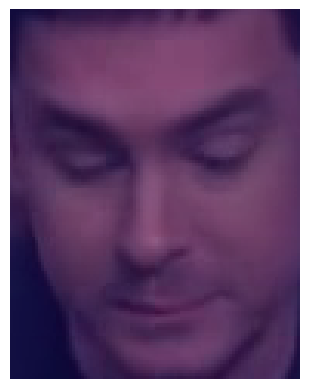

Applying Grad-CAM...


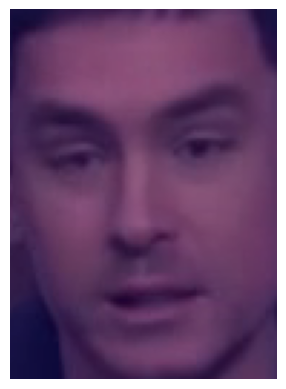

Applying Grad-CAM...


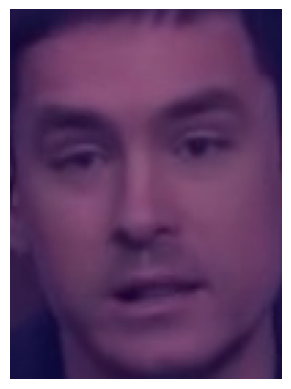

Applying Grad-CAM...


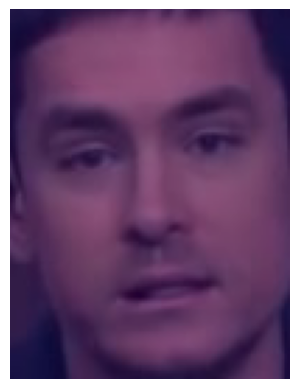

Applying Grad-CAM...


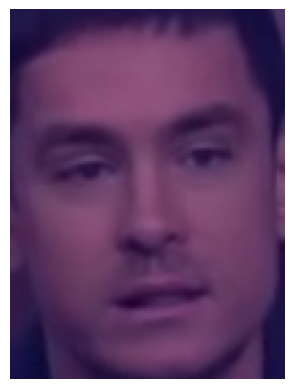

Applying Grad-CAM...


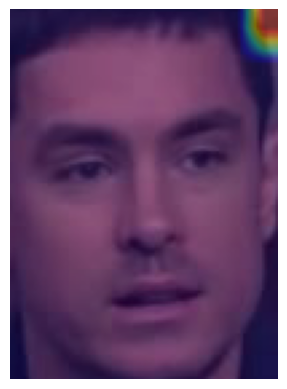

Applying Grad-CAM...


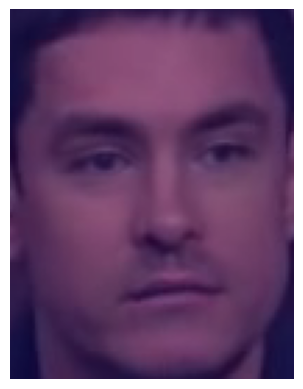

Applying Grad-CAM...


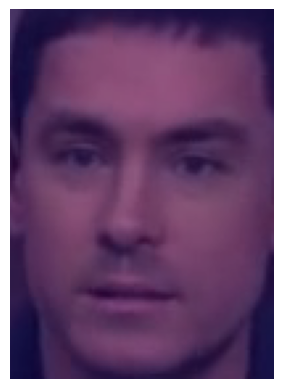

Applying Grad-CAM...


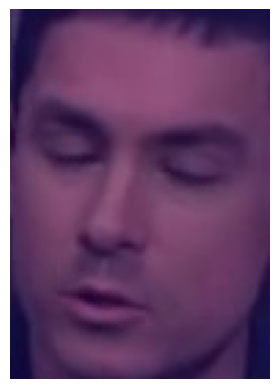

Applying Grad-CAM...


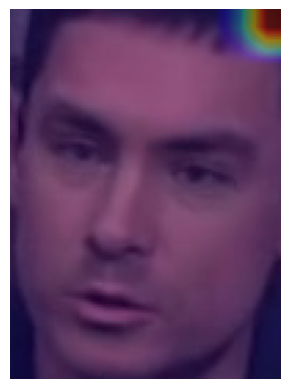

Applying Grad-CAM...


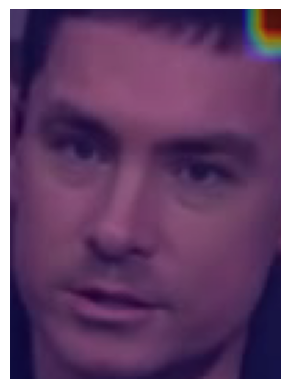

Applying Grad-CAM...


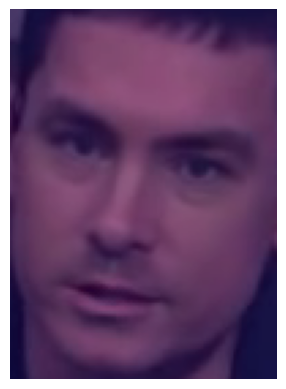

Applying Grad-CAM...


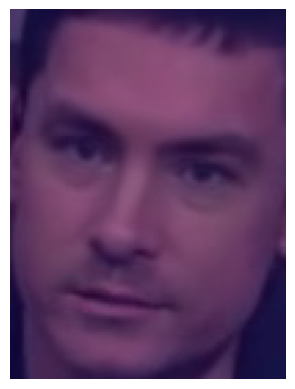

Applying Grad-CAM...


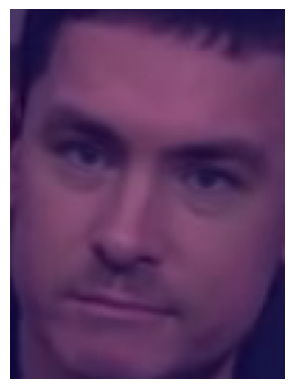

Applying Grad-CAM...


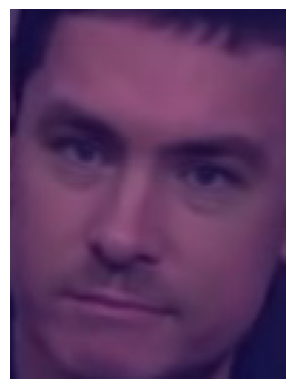

Applying Grad-CAM...


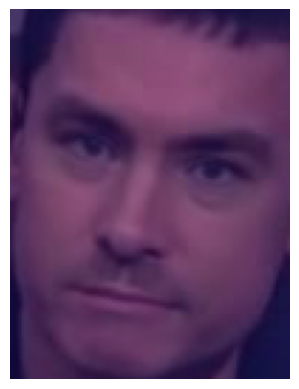

Applying Grad-CAM...


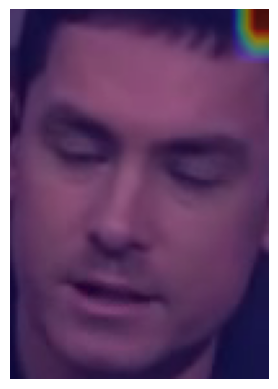

Applying Grad-CAM...


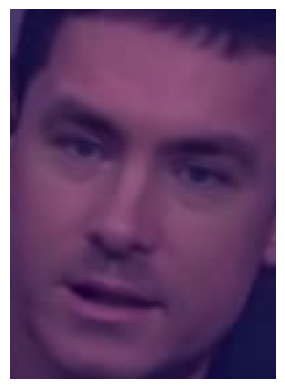

Applying Grad-CAM...


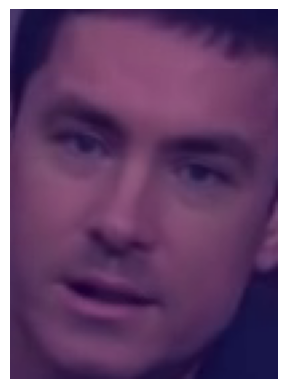

Applying Grad-CAM...


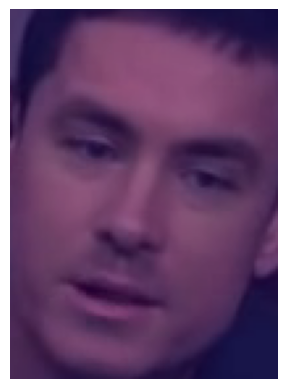

Applying Grad-CAM...


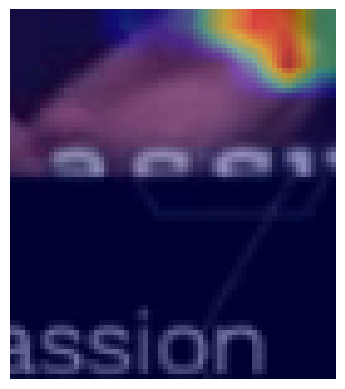

Applying Grad-CAM...


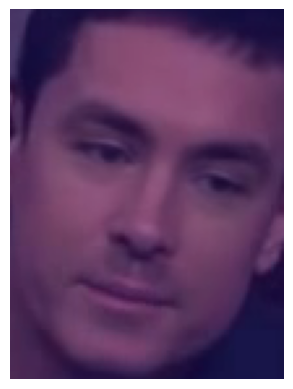

Applying Grad-CAM...


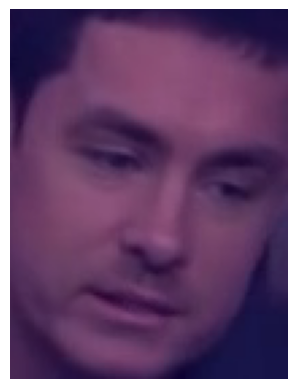

Applying Grad-CAM...


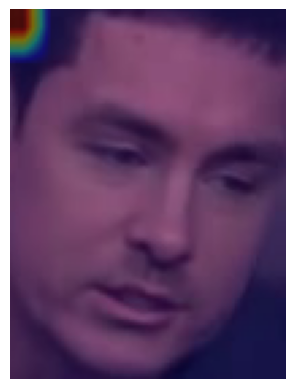

Applying Grad-CAM...


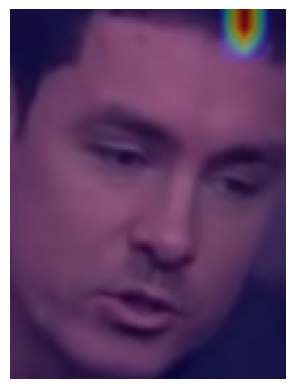

Applying Grad-CAM...


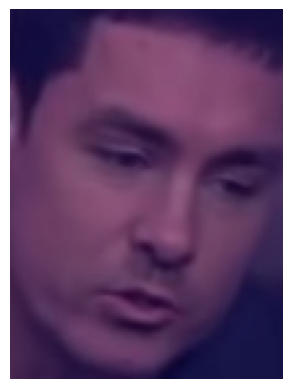

Applying Grad-CAM...


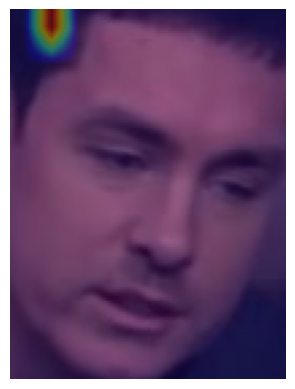

Applying Grad-CAM...


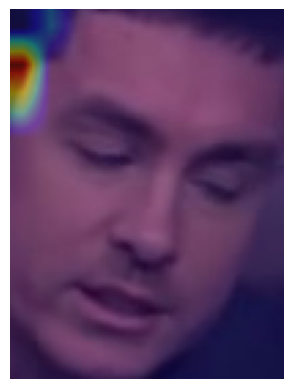

Applying Grad-CAM...


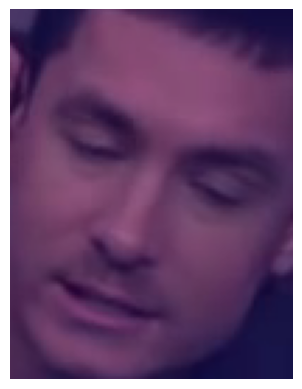

Applying Grad-CAM...


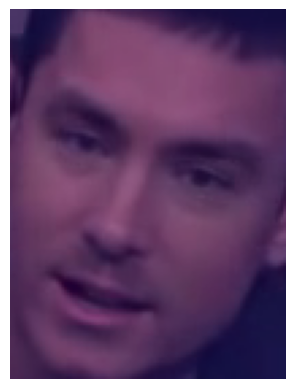

Applying Grad-CAM...


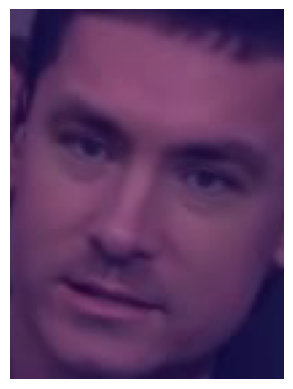

Applying Grad-CAM...


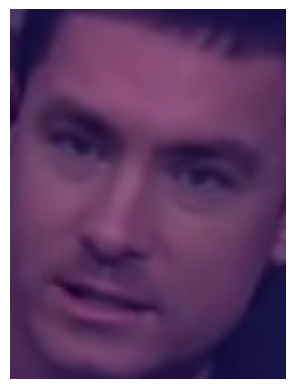

Applying Grad-CAM...


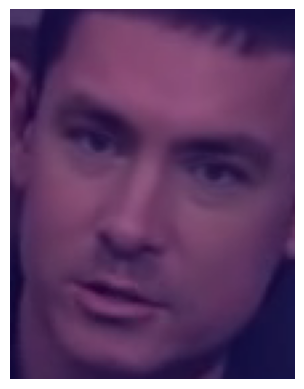

Applying Grad-CAM...


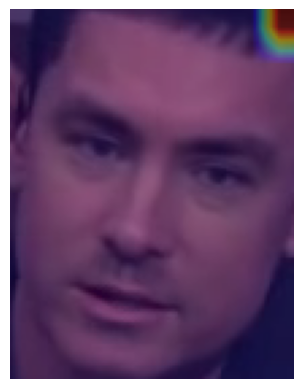

Applying Grad-CAM...


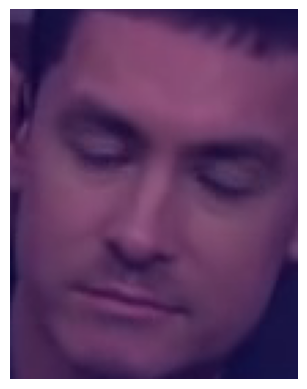

Applying Grad-CAM...


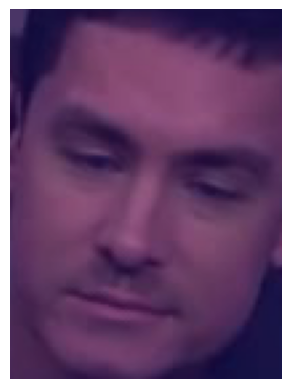

Applying Grad-CAM...


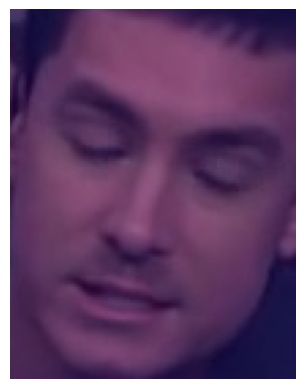

Applying Grad-CAM...


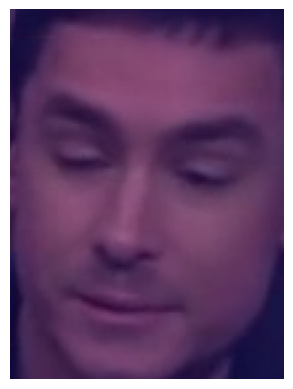

Applying Grad-CAM...


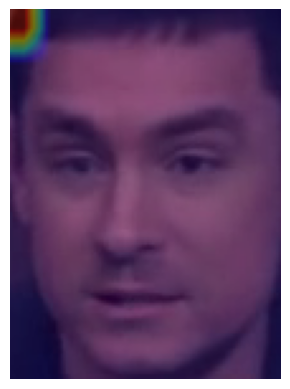

Applying Grad-CAM...


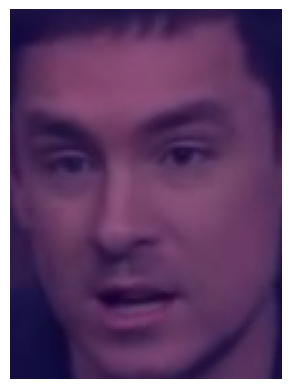

Applying Grad-CAM...


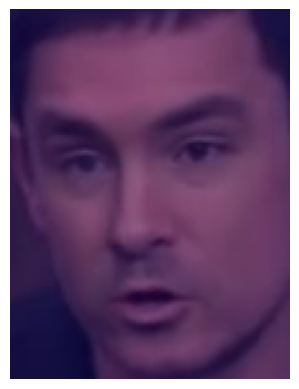

Applying Grad-CAM...


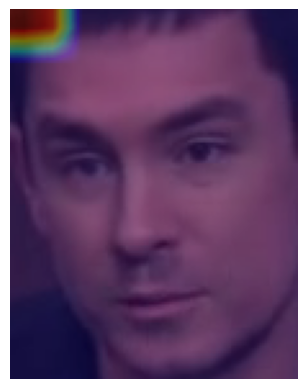

Applying Grad-CAM...


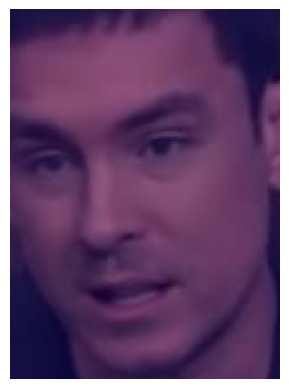

Applying Grad-CAM...


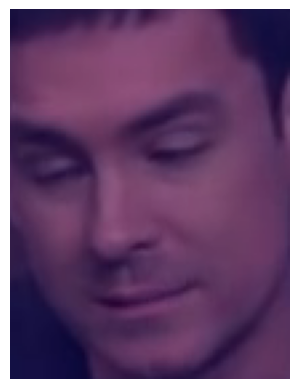

Applying Grad-CAM...


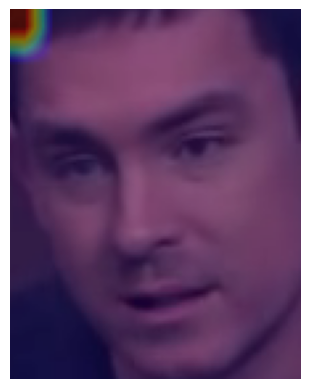

Applying Grad-CAM...


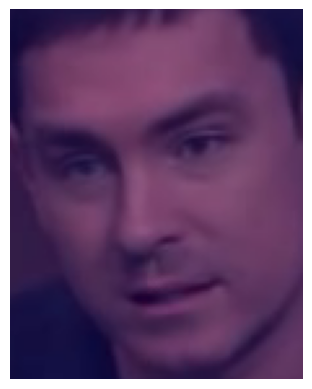

Applying Grad-CAM...


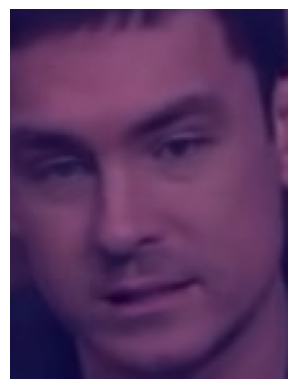

Applying Grad-CAM...


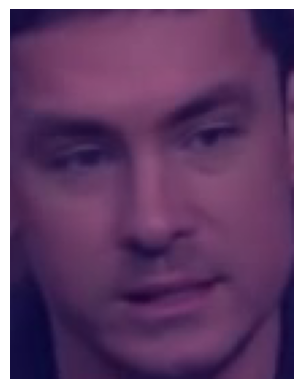

Applying Grad-CAM...


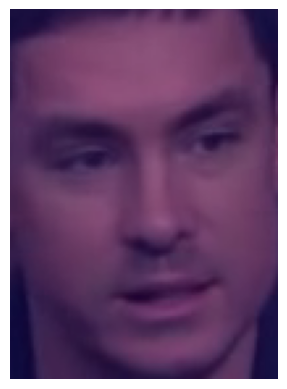

Applying Grad-CAM...


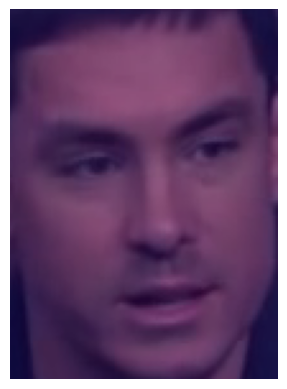

Applying Grad-CAM...


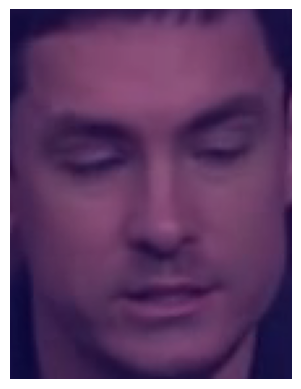

Applying Grad-CAM...


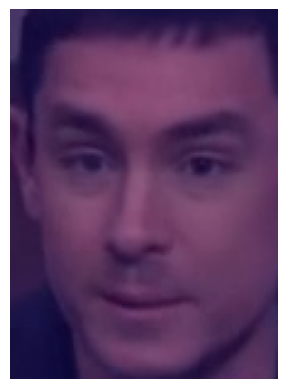

Applying Grad-CAM...


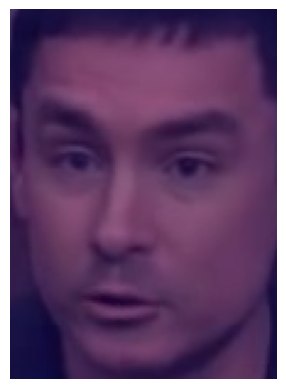

Applying Grad-CAM...


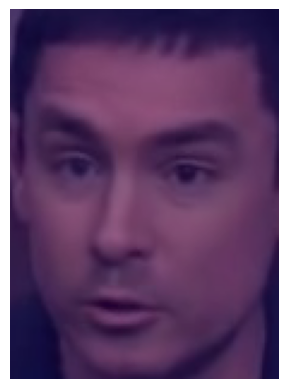

Applying Grad-CAM...


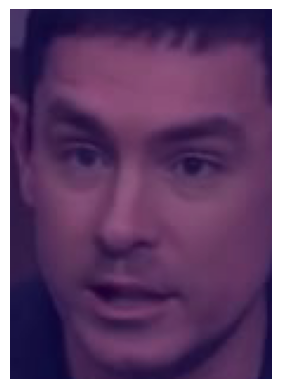

Applying Grad-CAM...


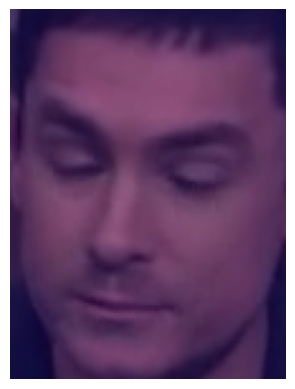

Applying Grad-CAM...


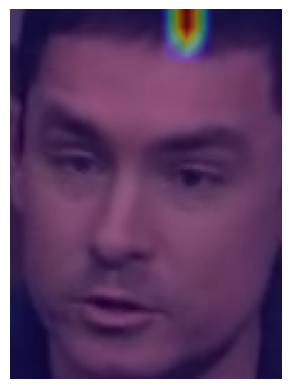

Applying Grad-CAM...


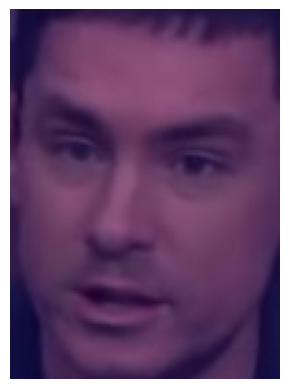

Applying Grad-CAM...


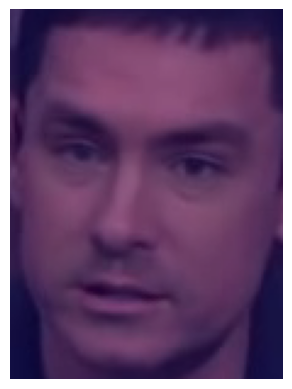

Applying Grad-CAM...


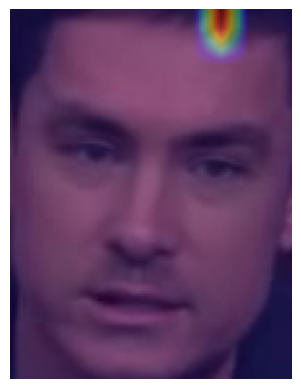

Applying Grad-CAM...


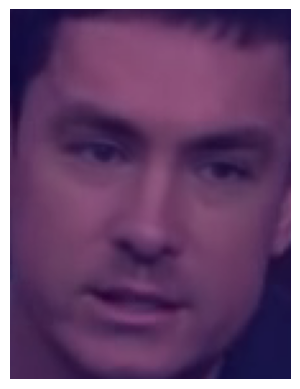

Applying Grad-CAM...


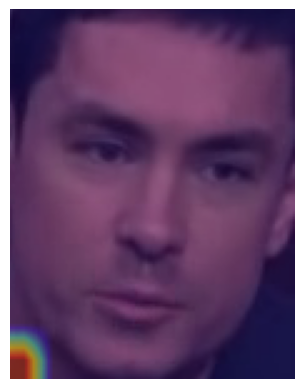

Applying Grad-CAM...


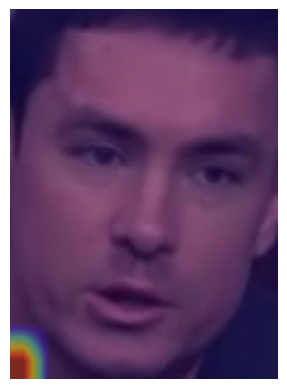

Applying Grad-CAM...


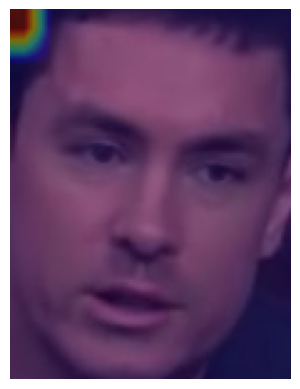

Applying Grad-CAM...


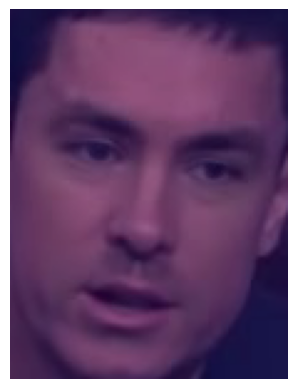

Applying Grad-CAM...


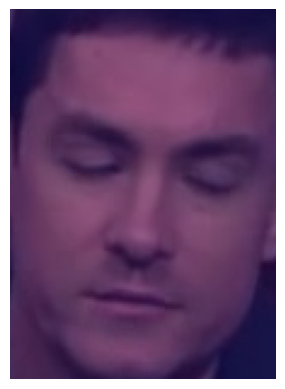

Applying Grad-CAM...


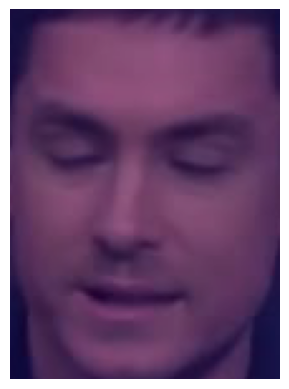

Applying Grad-CAM...


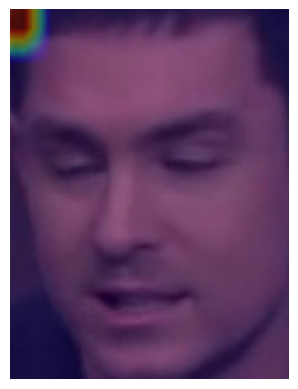

Applying Grad-CAM...


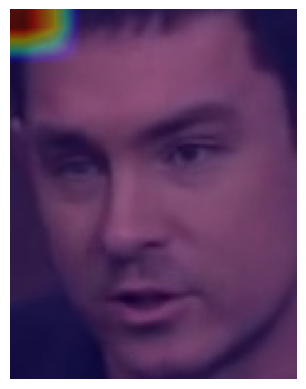

Applying Grad-CAM...


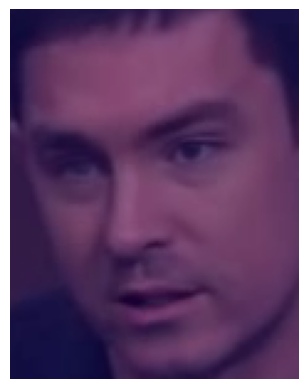

Applying Grad-CAM...


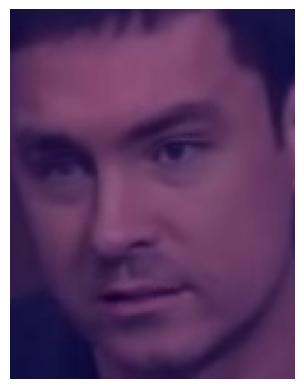

Applying Grad-CAM...


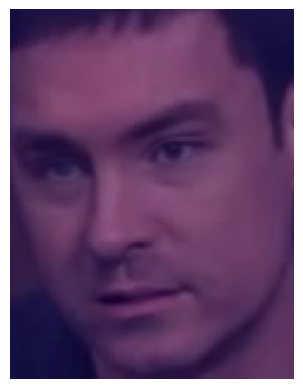

Applying Grad-CAM...


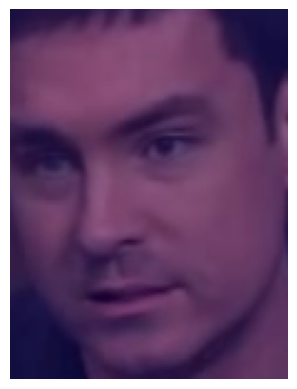

Applying Grad-CAM...


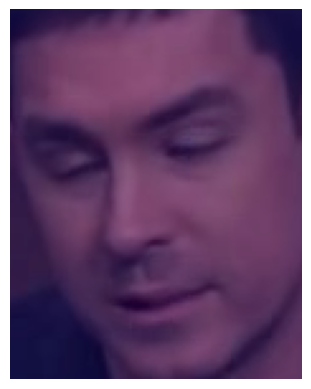

Classificando rostos...
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 

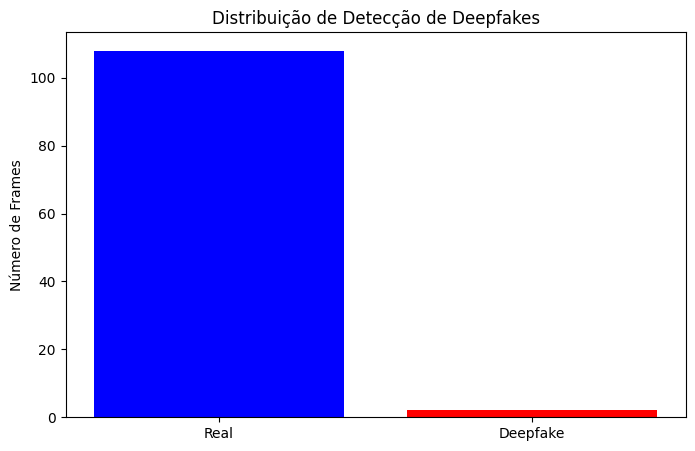

In [74]:
# Executar a detecção em um vídeo MP4 Fake
video_file = "/kaggle/input/celeb-fake/id0_id3_0009.mp4" # Fake

detect_deepfakes(video_file)

Extraindo quadros...
Detectando rostos...


/kaggle/working/facenet_pytorch/models/mtcnn.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(state_dict_path)
/kaggle/working/facenet_pytorch/mo

Applying Grad-CAM...


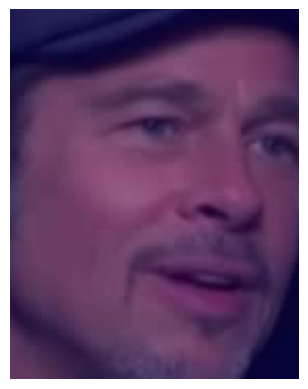

Applying Grad-CAM...


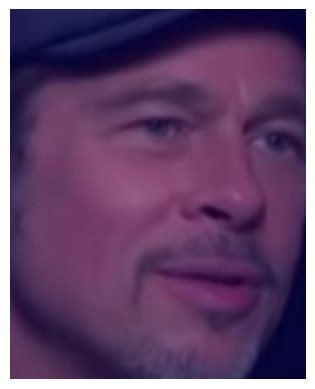

Applying Grad-CAM...


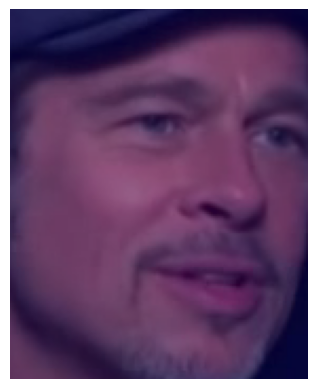

Applying Grad-CAM...


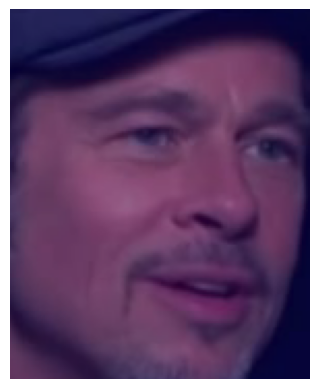

Applying Grad-CAM...


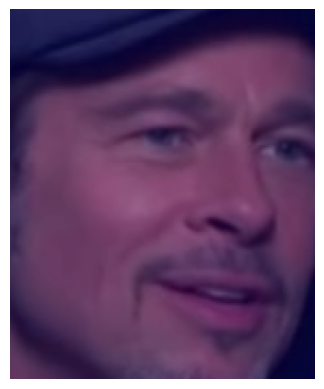

Applying Grad-CAM...


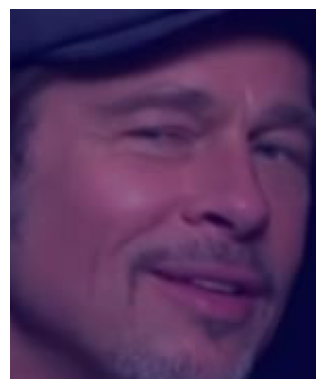

Applying Grad-CAM...


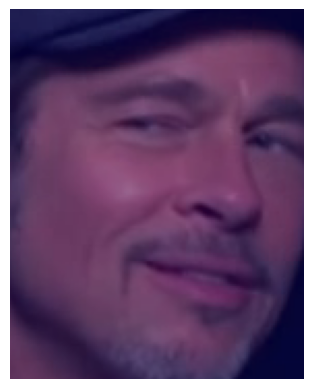

Applying Grad-CAM...


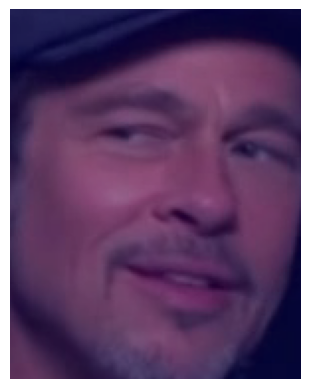

Applying Grad-CAM...


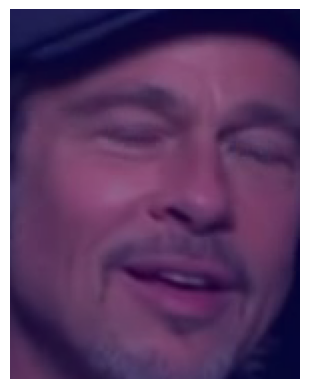

Applying Grad-CAM...


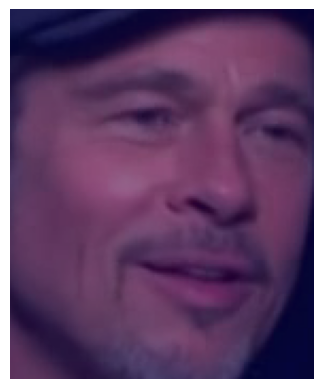

Applying Grad-CAM...


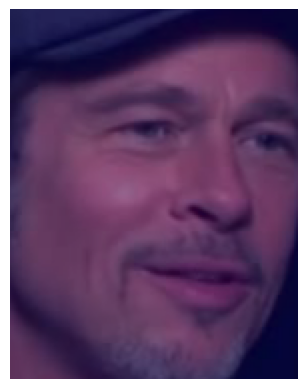

Applying Grad-CAM...


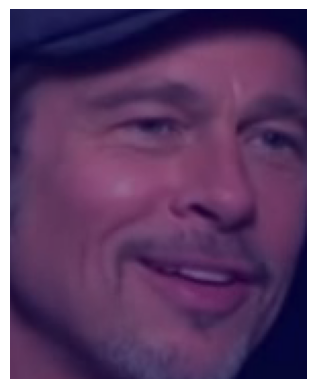

Applying Grad-CAM...


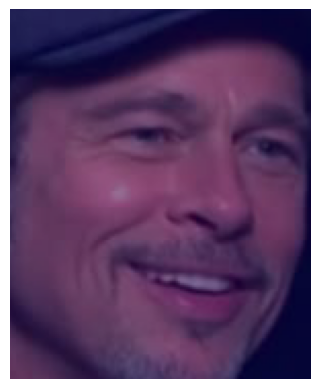

Applying Grad-CAM...


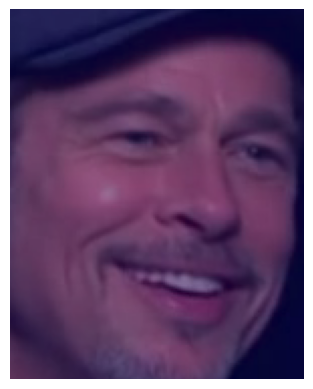

Applying Grad-CAM...


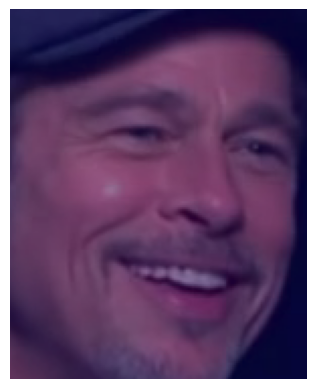

Applying Grad-CAM...


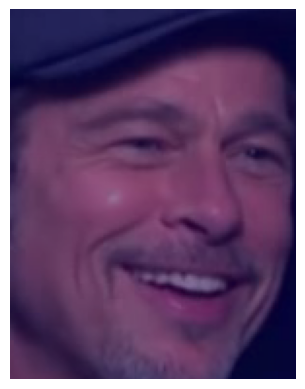

Applying Grad-CAM...


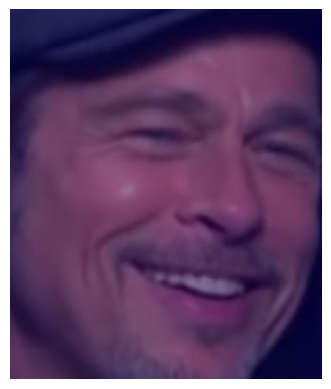

Applying Grad-CAM...


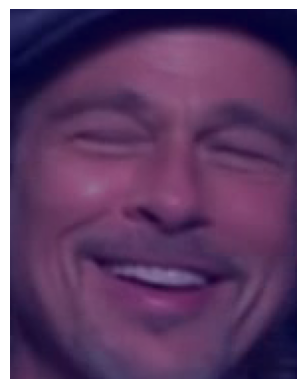

Applying Grad-CAM...


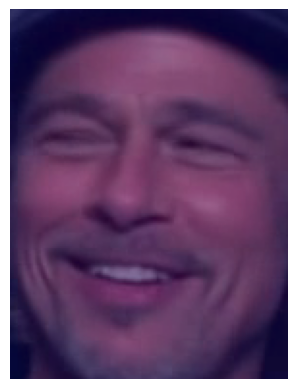

Applying Grad-CAM...


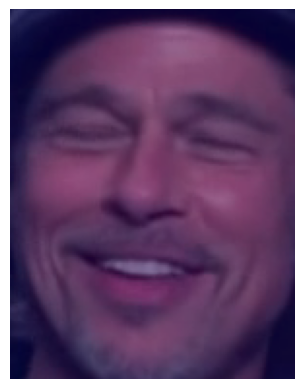

Applying Grad-CAM...


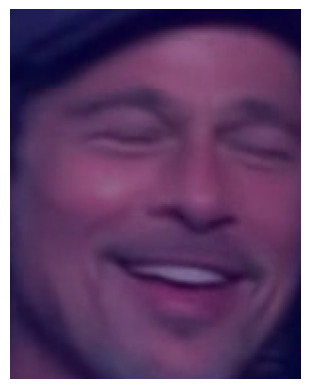

Applying Grad-CAM...


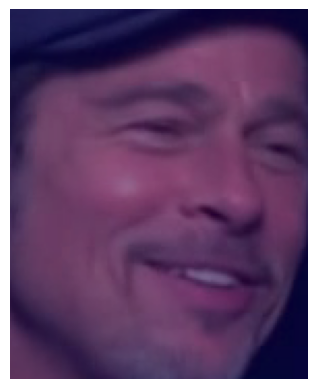

Applying Grad-CAM...


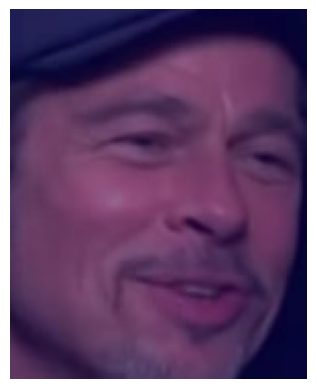

Applying Grad-CAM...


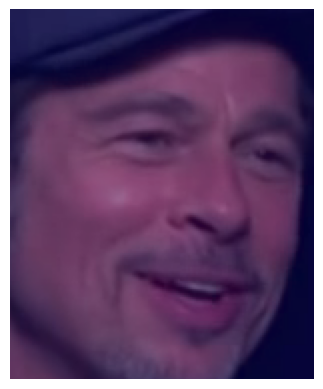

Applying Grad-CAM...


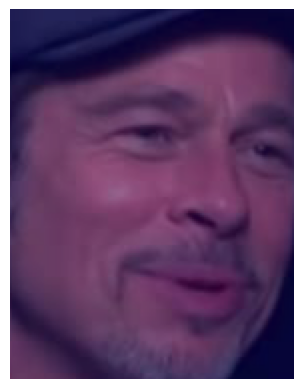

Applying Grad-CAM...


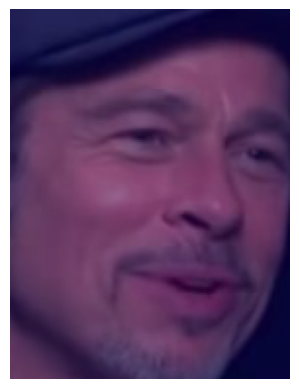

Applying Grad-CAM...


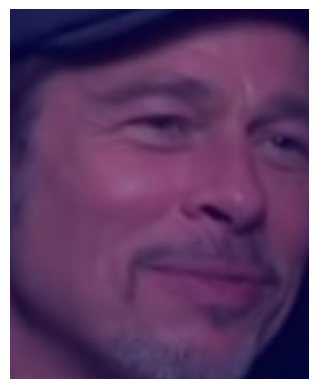

Applying Grad-CAM...


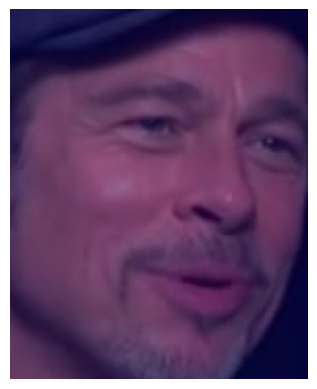

Applying Grad-CAM...


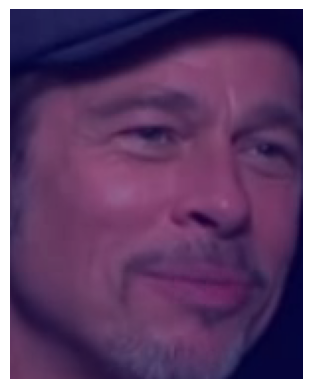

Applying Grad-CAM...


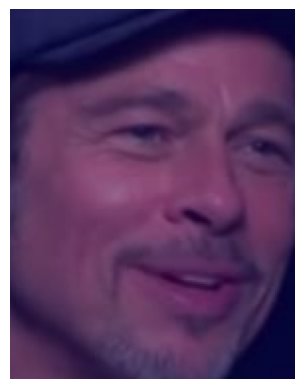

Applying Grad-CAM...


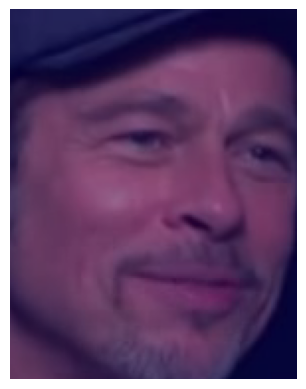

Applying Grad-CAM...


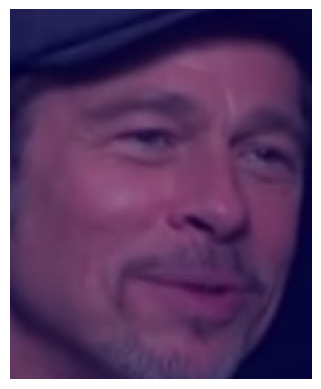

Applying Grad-CAM...


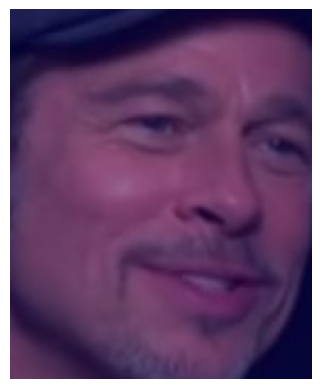

Applying Grad-CAM...


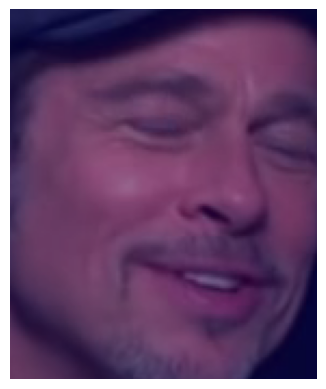

Applying Grad-CAM...


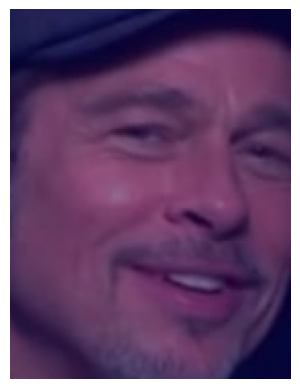

Applying Grad-CAM...


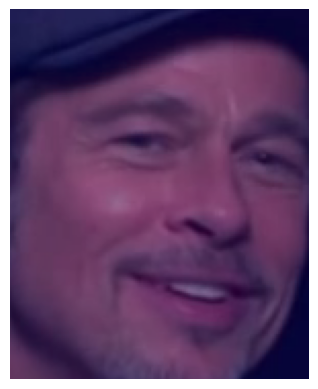

Applying Grad-CAM...


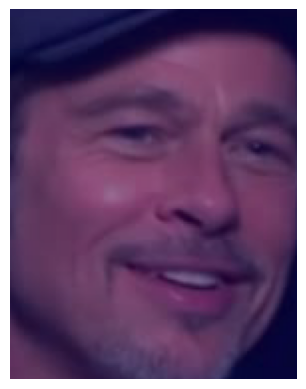

Applying Grad-CAM...


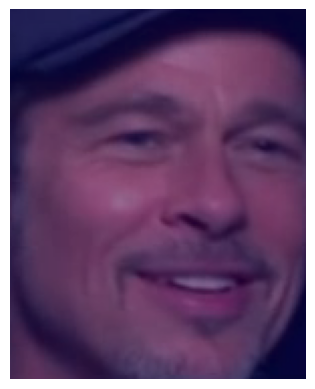

Applying Grad-CAM...


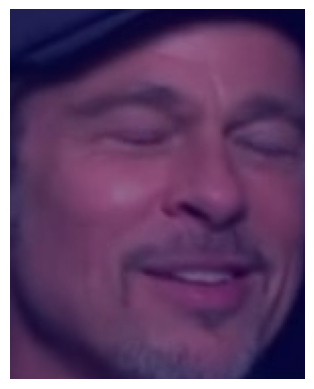

Applying Grad-CAM...


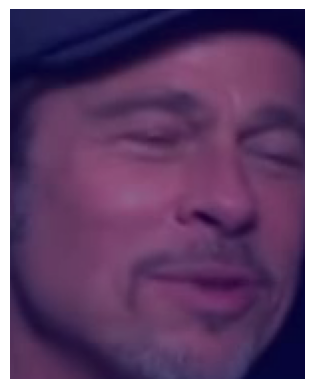

Applying Grad-CAM...


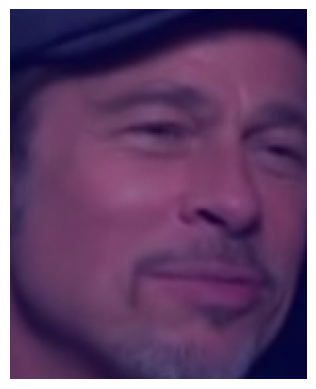

Applying Grad-CAM...


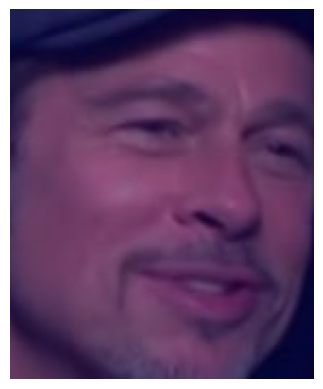

Applying Grad-CAM...


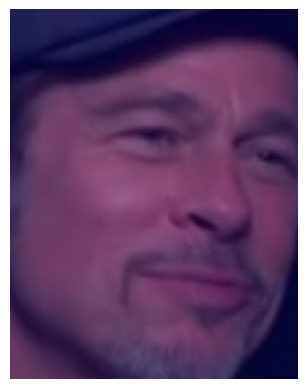

Applying Grad-CAM...


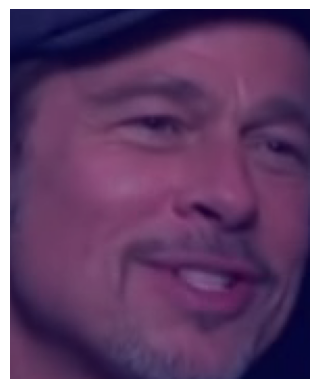

Applying Grad-CAM...


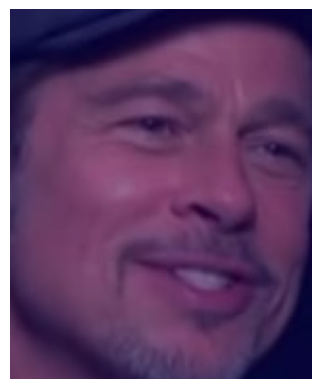

Applying Grad-CAM...


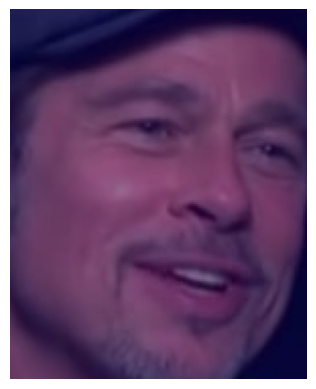

Applying Grad-CAM...


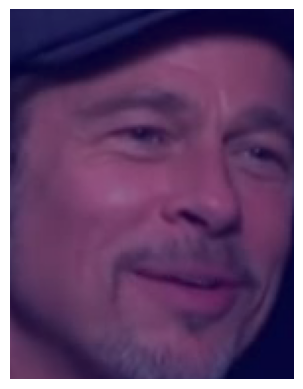

Applying Grad-CAM...


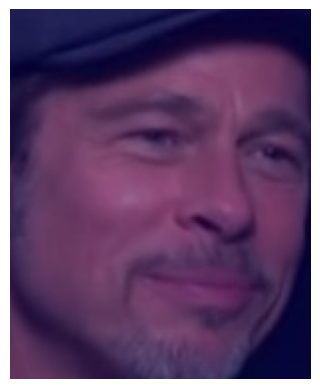

Applying Grad-CAM...


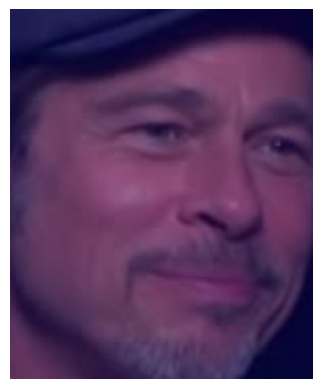

Applying Grad-CAM...


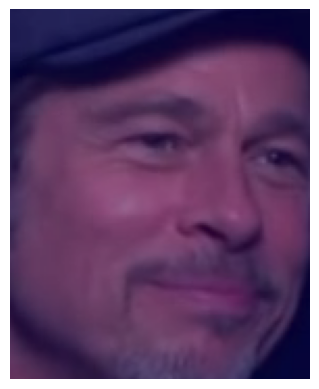

Applying Grad-CAM...


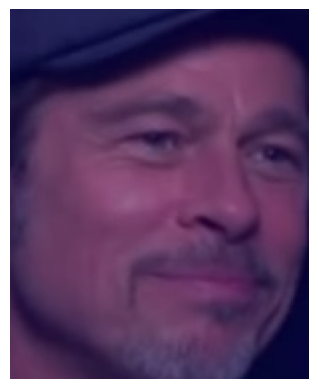

Applying Grad-CAM...


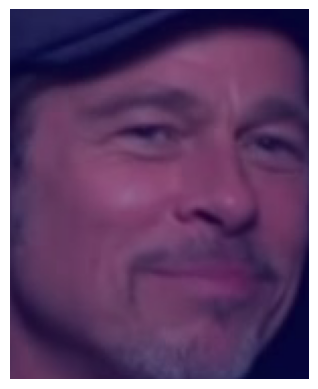

Applying Grad-CAM...


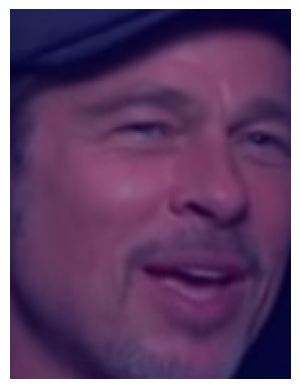

Applying Grad-CAM...


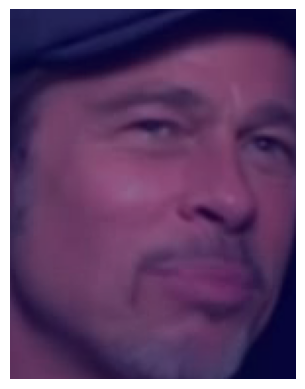

Applying Grad-CAM...


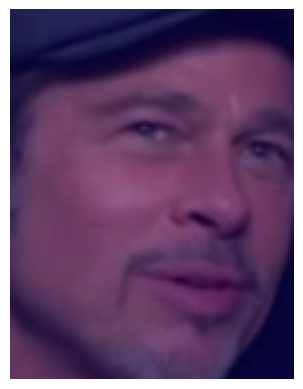

Applying Grad-CAM...


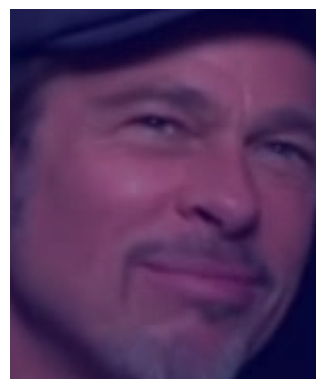

Applying Grad-CAM...


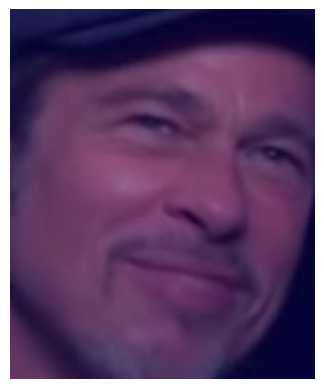

Applying Grad-CAM...


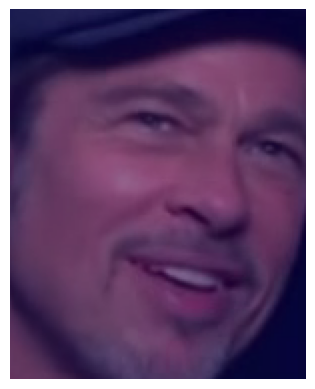

Applying Grad-CAM...


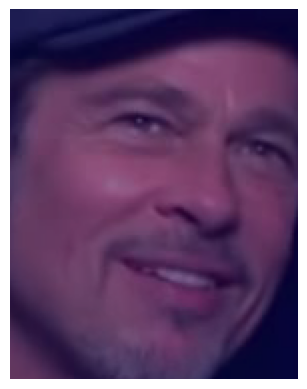

Applying Grad-CAM...


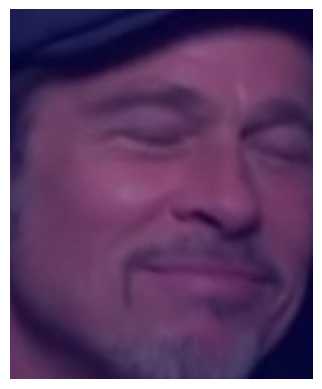

Applying Grad-CAM...


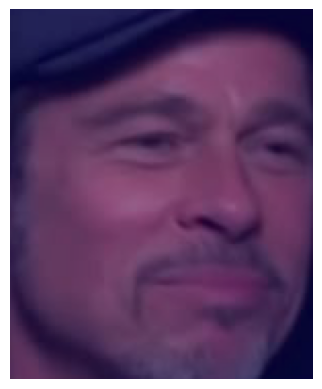

Applying Grad-CAM...


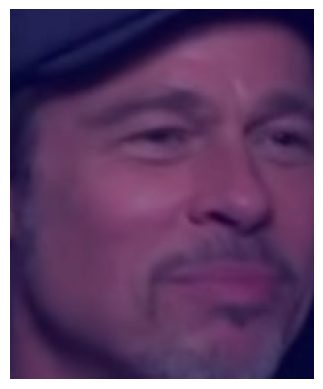

Applying Grad-CAM...


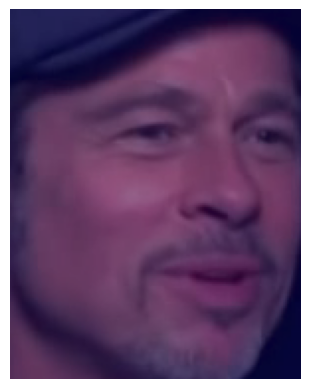

Applying Grad-CAM...


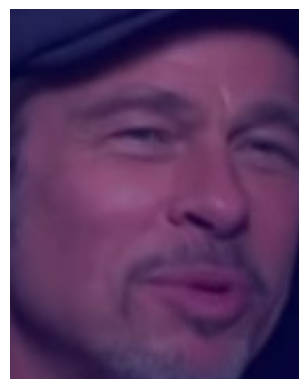

Applying Grad-CAM...


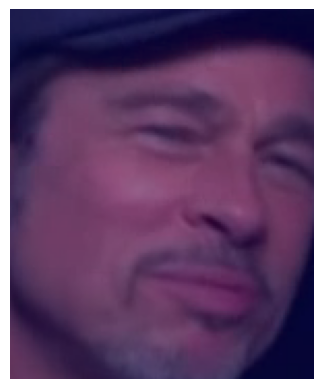

Applying Grad-CAM...


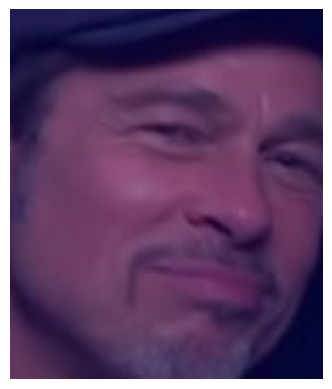

Applying Grad-CAM...


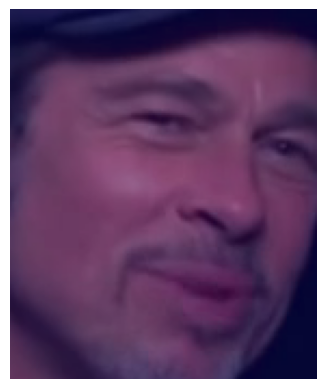

Applying Grad-CAM...


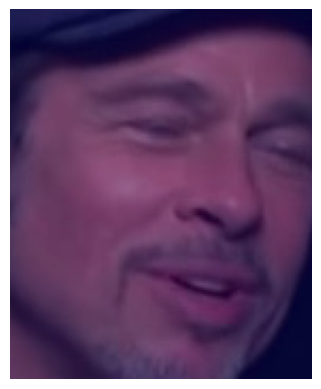

Applying Grad-CAM...


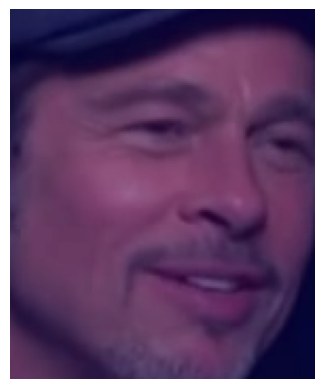

Applying Grad-CAM...


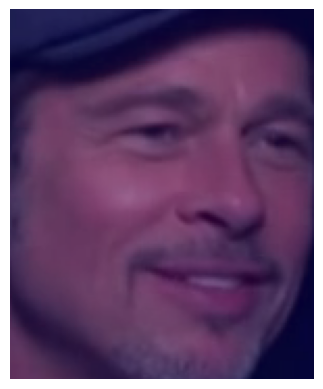

Applying Grad-CAM...


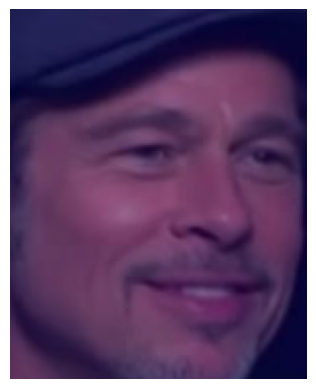

Applying Grad-CAM...


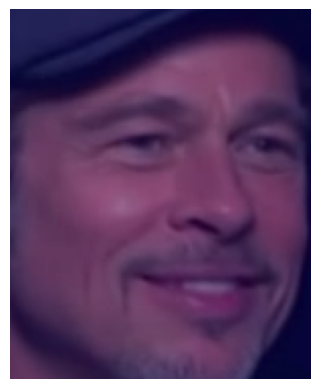

Applying Grad-CAM...


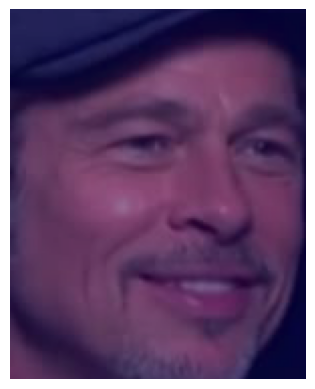

Classificando rostos...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1

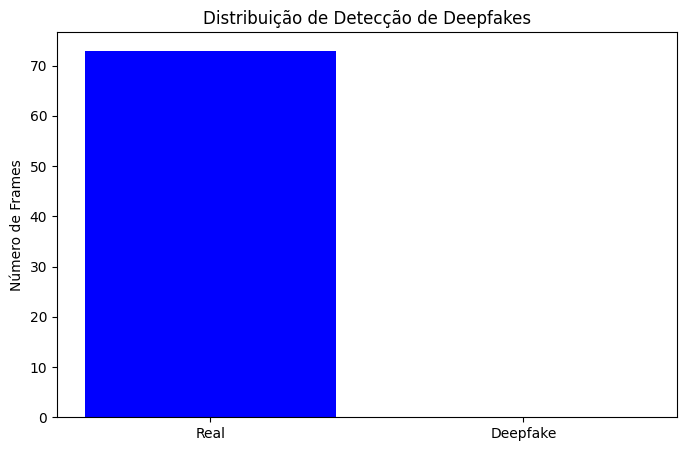

In [75]:
# Executar a detecção em um vídeo MP4 Real
video_file = "/kaggle/input/celebe-real/id1_0000.mp4"      # Real

detect_deepfakes(video_file)

### Evaluate Model

In [80]:
# Função para processar vídeos no diretório e gerar matriz de confusão
def evaluate_videos(video_dir):
    initial_time = datetime.datetime.now()
    print(f"Start at {initial_time.strftime('%d-%m-%Y %H:%M:%S')}")
    
    true_labels = []
    pred_labels = []

    for class_label in  ["Real", "Deepfake"]:

        class_label_dir = ""
        if class_label == "Real":
            class_label_dir = "celebe-real"
        else:
            class_label_dir = "celeb-fake"
            
        class_dir = os.path.join(video_dir, class_label_dir)
        print(class_dir)

        if not os.path.exists(class_dir):
            continue

        # Listar apenas os primeiros 10 arquivos de cada categoria (Real e Fake)
        video_files = sorted([f for f in os.listdir(class_dir) if f.endswith(".mp4")])[:10]

        #for video_file in os.listdir(class_dir):
        for video_file in video_files:
            if video_file.endswith(".mp4"):
                video_path = os.path.join(class_dir, video_file)
                print(f"\nProcessando: {video_file} ({class_label})")

                # Extração de frames e detecção de deepfake
                frames = extract_frames(video_path)
                faces = detect_faces(frames)

                if not faces:
                    print(f"Aviso: Nenhum rosto detectado no vídeo {video_file}. Classificação padrão como 'Real'.")
                    pred_label = "Real"
                else:
                    results, detection = classify_faces(faces)
                    pred_label = detection

                # Salvar rótulos reais e preditos
                true_labels.append(class_label)
                pred_labels.append(pred_label)

    # Gerar matriz de confusão
    cm = confusion_matrix(true_labels, pred_labels, labels=["Real", "Deepfake"])
    df_cm = pd.DataFrame(cm, index=["Real", "Deepfake"], columns=["Predito Real", "Predito Deepfake"])

    # Exibir matriz de confusão
    plt.figure(figsize=(6, 5))
    sns.heatmap(df_cm, annot=True, fmt="d", cmap="Blues", linewidths=0.5)
    plt.xlabel("Predição")
    plt.ylabel("Real")
    plt.title("Matriz de Confusão - Detecção de Deepfake")
    plt.show()

    # Exibir relatório de classificação
    print("\nRelatório de Classificação:")
    print(classification_report(true_labels, pred_labels, target_names=["Real", "Deepfake"]))

    final_time = datetime.datetime.now()
    duration = final_time - initial_time
    print(f"Finish at {final_time.strftime('%d-%m-%Y %H:%M:%S')}, duration: {duration}")

Start at 07-03-2025 15:12:10
/kaggle/input/celebe-real

Processando: id0_0000.mp4 (Real)


/kaggle/working/facenet_pytorch/models/mtcnn.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(state_dict_path)
/kaggle/working/facenet_pytorch/mo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 269ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

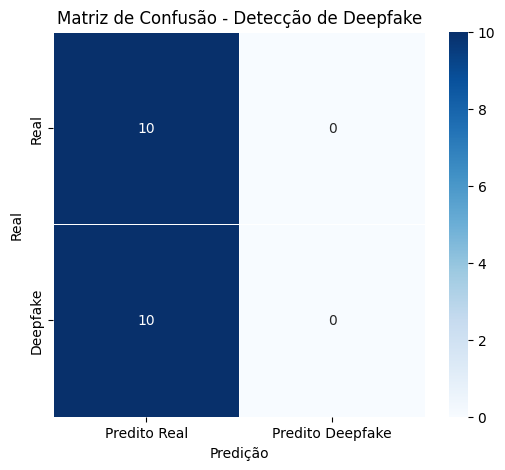


Relatório de Classificação:
              precision    recall  f1-score   support

        Real       0.00      0.00      0.00        10
    Deepfake       0.50      1.00      0.67        10

    accuracy                           0.50        20
   macro avg       0.25      0.50      0.33        20
weighted avg       0.25      0.50      0.33        20

Finish at 07-03-2025 15:27:42, duration: 0:15:31.095966


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [81]:
## Diretório de vídeos de teste
video_test_dir = "/kaggle/input/"

# Avaliação de todos os vídeos no diretório
evaluate_videos(video_test_dir)